## Check colab GPU allocation

In [2]:
# memory footprint support libraries/code
!ln -sf /opt/bin/nvidia-smi /usr/bin/nvidia-smi
!pip install gputil
!pip install psutil
!pip install humanize
import psutil
import humanize
import os
import GPUtil as GPU
GPUs = GPU.getGPUs()
# XXX: only one GPU on Colab and isn’t guaranteed
gpu = GPUs[0]
def printm():
 process = psutil.Process(os.getpid())
 print("Gen RAM Free: " + humanize.naturalsize( psutil.virtual_memory().available ), " | Proc size: " + humanize.naturalsize( process.memory_info().rss))
 print("GPU RAM Free: {0:.0f}MB | Used: {1:.0f}MB | Util {2:3.0f}% | Total {3:.0f}MB".format(gpu.memoryFree, gpu.memoryUsed, gpu.memoryUtil*100, gpu.memoryTotal))
printm()

!nvidia-smi

Gen RAM Free: 25.7 GB  | Proc size: 1.3 GB
GPU RAM Free: 15927MB | Used: 353MB | Util   2% | Total 16280MB
Sat Mar 28 09:53:32 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 418.67       Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P0    35W / 250W |    353MiB / 16280MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+------------------------------------------------------------

## Get files

In [2]:
!wget -O photon.hdf5 https://cernbox.cern.ch/index.php/s/AtBT8y4MiQYFcgc/download
!wget -O electron.hdf5 https://cernbox.cern.ch/index.php/s/FbXw3V4XNyYB3oA/download

--2020-03-28 06:29:17--  https://cernbox.cern.ch/index.php/s/AtBT8y4MiQYFcgc/download
Resolving cernbox.cern.ch (cernbox.cern.ch)... 128.142.32.26, 128.142.32.38
Connecting to cernbox.cern.ch (cernbox.cern.ch)|128.142.32.26|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 119703858 (114M) [application/octet-stream]
Saving to: ‘photon.hdf5’

photon.hdf5         100%[===================>] 114.16M  20.5MB/s    in 6.5s    

Last-modified header invalid -- time-stamp ignored.
2020-03-28 06:29:27 (17.5 MB/s) - ‘photon.hdf5’ saved [119703858/119703858]

--2020-03-28 06:29:28--  https://cernbox.cern.ch/index.php/s/FbXw3V4XNyYB3oA/download
Resolving cernbox.cern.ch (cernbox.cern.ch)... 128.142.32.26, 128.142.32.38
Connecting to cernbox.cern.ch (cernbox.cern.ch)|128.142.32.26|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 128927319 (123M) [application/octet-stream]
Saving to: ‘electron.hdf5’

electron.hdf5       100%[===================>] 122.9

In [4]:
import h5py
import numpy as np
%tensorflow_version 2.x
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import layers
import torch
import pandas as pd
import os
import datetime

LOG_DIR = 'logdir/'

tf.test.gpu_device_name()

'/device:GPU:0'

In [4]:
electron_raw = h5py.File('electron.hdf5', 'r')
photon_raw = h5py.File('photon.hdf5', 'r')
#print(list(electron_raw.keys()))

# equal counts of electron 1 and photon 0: 249000
DATASET_SIZE = len(electron_raw['y']) + len(photon_raw['y'])
DATA_SHAPE = electron_raw['X'].shape[1:]
print('size', DATASET_SIZE)

X_np = np.r_[electron_raw['X'], photon_raw['X']]
y_np = np.r_[electron_raw['y'], photon_raw['y']]
idx = np.arange(DATASET_SIZE); np.random.shuffle(idx)
X_np, y_np = X_np[idx], y_np[idx]

size 498000


# Data Exploration

In [0]:
import matplotlib.pyplot as plt

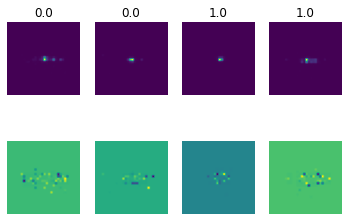

In [0]:
_, axes = plt.subplots(2, 4)

for i in range(4):
  idx = np.random.choice(np.arange(len(X_np)))
  ax = axes[0][i]
  ax.imshow(X_np[idx][..., 0])
  ax.axis('off')
  ax.set_title(y_np[idx])
  ax = axes[1][i]
  ax.axis('off')
  ax.imshow(X_np[idx][..., 1])

plt.show()

In [0]:
idx = np.random.choice(np.arange(len(X_np)))
slice = X_np[idx][...,0]

print('min, max')
# Hit energy
print(np.min(slice), np.max(slice))

slice = X_np[idx][...,1]
# Hit time
print(np.min(slice), np.max(slice))

# Model Architecture
9 layer network, 8 convolutional layers with batch normalization and ReLU activation functions, and 1 FC layer.

Downsampling was done with strides 2 instead of max pooling.
# Training
I used Stocastic Gradient Descent with momentum of 0.9 and a cyclical learning rate between 0.1 and 0.001. I also used L2 regularization. Model was trained with 32 epochs.

#Tensorflow Keras

In [0]:
X, y = tf.convert_to_tensor(X_np), tf.convert_to_tensor(y_np)
validation = X[:20000], y[:20000]
test = X[20000:30000], y[20000:30000]
train = X[30000:], y[30000:]

In [0]:
X_train, y_train = train
X_valid, y_valid = validation
X_test, y_test = test

In [0]:
class Args: pass
args = Args()
args.base_lr = 0.001 #0.001
args.max_lr = 0.1 #0.1
args.l2norm = 0.0001
args.epochs = 32
args.cycle = 2
args.batch_size = 256
args.momentum = 0.9

MODEL_PATH = './model.pt'

In [0]:
regularizer = tf.keras.regularizers.l2(args.l2norm)
initializer = tf.keras.initializers.he_normal()

model = tf.keras.Sequential([
  layers.Conv2D(
      filters=32, kernel_size=7, strides=1, padding='same', kernel_regularizer=regularizer, kernel_initializer=initializer
      ), 
      layers.BatchNormalization(
          axis=1, momentum=0.1, epsilon=0.00001
          ), 
          layers.ReLU(),
  layers.Conv2D(32, 3, 1, 'same', kernel_regularizer=regularizer, kernel_initializer=initializer), layers.BatchNormalization(1, 0.1, 0.00001), layers.ReLU(),

  layers.Conv2D(64, 3, 2, 'same', kernel_regularizer=regularizer, kernel_initializer=initializer), layers.BatchNormalization(1, 0.1, 0.00001), layers.ReLU(),
  layers.Conv2D(64, 3, 1, 'same', kernel_regularizer=regularizer, kernel_initializer=initializer), layers.BatchNormalization(1, 0.1, 0.00001), layers.ReLU(),
  
  layers.Conv2D(128, 3, 2, 'same', kernel_regularizer=regularizer, kernel_initializer=initializer), layers.BatchNormalization(1, 0.1, 0.00001), layers.ReLU(),
  layers.Conv2D(128, 3, 1, 'same', kernel_regularizer=regularizer, kernel_initializer=initializer), layers.BatchNormalization(1, 0.1, 0.00001), layers.ReLU(),
  
  layers.Conv2D(256, 3, 2, 'same', kernel_regularizer=regularizer, kernel_initializer=initializer), layers.BatchNormalization(1, 0.1, 0.00001), layers.ReLU(),
  layers.Conv2D(256, 3, 1, 'same', kernel_regularizer=regularizer, kernel_initializer=initializer), layers.BatchNormalization(1, 0.1, 0.00001), layers.ReLU(),

  layers.AveragePooling2D((4, 4)), layers.Flatten(),

  layers.Dense(1, 'sigmoid', kernel_regularizer=regularizer, kernel_initializer=initializer)
])

sigmoid_loss = tf.keras.losses.BinaryCrossentropy()
lr_schedule = tfa.optimizers.Triangular2CyclicalLearningRate(
    initial_learning_rate = args.base_lr,
    maximal_learning_rate = args.max_lr,
    step_size = X_train.shape[0] // args.batch_size * args.cycle
)
optimizer = tf.keras.optimizers.SGD(learning_rate=lr_schedule, momentum=args.momentum)
model.compile('sgd', sigmoid_loss, ['acc'])

In [84]:
%load_ext tensorboard
%tensorboard --logdir=$LOG_DIR

time_s = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
callbacks = [tf.keras.callbacks.TensorBoard(os.path.join(LOG_DIR, time_s), update_freq='batch')]
model.fit(X_train, y_train, args.batch_size, args.epochs, validation_data=(X_valid, y_valid), callbacks=callbacks)

Output hidden; open in https://colab.research.google.com to view.

#Pytorch

In [0]:
from torch.utils.data import Dataset, DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.tensorboard as tb

device = 'cuda' if torch.cuda.is_available() else 'cpu'

In [0]:
class ParticleDataset(Dataset):
  def __init__(self, X, y): self.X, self.y = X, y
  def __len__(self): return self.X.shape[0]
  def __getitem__(self, idx): return np.moveaxis(self.X[idx], -1, 0), self.y[idx]

In [7]:
validation = X_np[:20000], y_np[:20000]
test = X_np[20000:30000], y_np[20000:30000]
train = X_np[30000:], y_np[30000:]

NameError: ignored

In [0]:
def get_acc(preds, targets):
  return torch.mean(torch.eq(preds, targets).float())

In [0]:
init_ = lambda m: nn.init.kaiming_normal_(m.weight) if hasattr(m, 'weight') and not isinstance(m, nn.BatchNorm1d) and not isinstance(m, nn.BatchNorm2d) else None


In [9]:
model = nn.Sequential(
    nn.Conv2d(2, 32, 7, 1, 3), nn.BatchNorm2d(32), nn.ReLU(), 
    nn.Conv2d(32, 32, 3, 1, 1), nn.BatchNorm2d(32), nn.ReLU(),

    nn.Conv2d(32, 64, 3, 2, 1), nn.BatchNorm2d(64), nn.ReLU(),
    nn.Conv2d(64, 64, 3, 1, 1), nn.BatchNorm2d(64), nn.ReLU(),

    nn.Conv2d(64, 128, 3, 2, 1), nn.BatchNorm2d(128), nn.ReLU(),
    nn.Conv2d(128, 128, 3, 1, 1), nn.BatchNorm2d(128), nn.ReLU(),

    nn.Conv2d(128, 256, 3, 2, 1), nn.BatchNorm2d(256), nn.ReLU(),
    nn.Conv2d(256, 256, 3, 1, 1), nn.BatchNorm2d(256), nn.ReLU(),

    nn.AdaptiveAvgPool2d((1, 1)), nn.Flatten(),

    nn.Linear(256, 1),
    nn.Sigmoid()
    )

model.apply(init_)

Sequential(
  (0): Conv2d(2, 32, kernel_size=(7, 7), stride=(1, 1), padding=(3, 3))
  (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (4): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (5): ReLU()
  (6): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (8): ReLU()
  (9): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (11): ReLU()
  (12): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
  (13): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (14): ReLU()
  (15): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (16): BatchNorm2d(128, eps=1e-05, 

In [86]:
np.sum([p.numel() for p in model.parameters()])

1176705

## LR Tuning Log
SGD:
- lr = cycle(0.1-0.001), acc = 73.5

Adam:
- lr = 0.003, batch=32, acc = 70
- lr = 0.03, batch = 256, acc = 68
- lr = 0.01, batch = 256, acc = 70 (*heavy fluctuations*)
- lr = 0.003, batch = 256, acc = 72 (*heavy fluctuations*)
- lr = 0.001, batch = 256, acc = 72.8 
- lr = 0.0003, batch = 256, acc = 72.8
- lr = 0.01-0.001, batch = 256, acc = 72.1

In [0]:
_ = model.apply(init_)

In [0]:
class Args: pass
args = Args()
args.base_lr = 0.001
args.max_lr = 0.1
args.l2norm = 0.0001
args.epochs = 32
args.cycle = 2
args.batch_size = 256
args.momentum = 0.9

MODEL_PATH = './model.pt'

In [0]:
#model.load_state_dict(torch.load(MODEL_PATH))

In [0]:
train_torch = DataLoader(ParticleDataset(train[0], train[1]), args.batch_size, True)
valid_torch = DataLoader(ParticleDataset(*validation), 256, True)

In [54]:
import time

# Load tensorboard
%load_ext tensorboard
%tensorboard --logdir $LOG_DIR

# Initialize model and algorithms
model.to(device)
optimizer = torch.optim.SGD(model.parameters(), lr=args.base_lr, weight_decay=args.l2norm, momentum=args.momentum)
scheduler = torch.optim.lr_scheduler.CyclicLR(optimizer, args.base_lr, args.max_lr, step_size_up = len(train_torch)*args.cycle)
loss_func = torch.nn.BCELoss()

# Setup logging
time_s = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
train_dir = os.path.join(LOG_DIR, 'train', time_s)
valid_dir = os.path.join(LOG_DIR, 'valid', time_s)
train_logger = tb.SummaryWriter(train_dir)
valid_logger = tb.SummaryWriter(valid_dir)

for epoch in range(args.epochs):
  train_acc, valid_acc = torch.zeros(len(train_torch)), torch.zeros(len(valid_torch)) # Reset epoch accuracy

  model.train() # Training mode
  # Loop through training data
  for batch_idx, (inputs, targets) in enumerate(train_torch):
    #if epoch==0 and batch_idx < 20: start_time = time.time() # Time batch for first 20 steps
    
    # Backprop
    optimizer.zero_grad()
    inputs, targets = inputs.to(device), targets.to(device)
    outputs = model(inputs).flatten()
    loss = loss_func(outputs, targets)
    loss.backward()
    optimizer.step()

    # Update scheduler
    scheduler.step()

    # Log metrics
    train_logger.add_scalar('loss', loss, batch_idx+epoch*len(train_torch))
    train_acc[batch_idx] = get_acc(torch.round(outputs), targets)
    train_logger.add_scalar('running acc', torch.mean(train_acc[max(0, batch_idx)-9: batch_idx+1]), batch_idx)
    # Print metrics
    #if epoch==0 and batch_idx < 20: print('batch-%i, time-%f' % (batch_idx, time.time()-start_time))
    if batch_idx % (len(train_torch)//3) == 0: print('e-%i, b-%i, loss-%f, acc-%f' % (epoch, batch_idx, loss, torch.mean(train_acc[0:batch_idx+1]).item()))
  train_logger.add_scalar('acc', torch.mean(train_acc), epoch) # Log training epoch metrics
  
  model.eval() # Evaluation mode
  # Loop through validation data
  for batch_idx, (inputs, targets) in enumerate(valid_torch):
    # Get prediction accuracy
    inputs, targets = inputs.to(device), targets.to(device)
    outputs = model(inputs).flatten()
    valid_acc[batch_idx] = get_acc(torch.round(outputs), targets)
  # Log validation epoch metrics
  valid_logger.add_scalar('acc', torch.mean(valid_acc), epoch)
  
  

  # Print epoch metrics
  print('lr:',  scheduler.get_last_lr()[0])
  print('---')
  print('train acc-%f, val acc-%f' % (torch.mean(train_acc), torch.mean(valid_acc)))
  print('---')


#torch.save(model.state_dict(), MODEL_PATH)
CHECKPOINT_PATH = './model_%s.pt' % time_s
torch.save(model.state_dict(), CHECKPOINT_PATH)

Output hidden; open in https://colab.research.google.com to view.

In [0]:
state_dict = model.state_dict()

In [0]:
# to beat: 73.5 (20200328-051913)
torch.save(model.state_dict(), MODEL_PATH)

In [0]:
def show_images(batch):
  X, y = batch
  _, axes = plt.subplots(2, len(X), figsize=(100,10), gridspec_kw={'hspace':0.05, 'wspace':0.05})
  
  for idx in range(len(X)):
    ax = axes[0][idx]
    ax.imshow(X[idx][0,...])
    ax.axis('off')
    ax.set_title(y[idx].item())
    ax = axes[1][idx]
    ax.imshow(X[idx][1,...])
    ax.axis('off')


  plt.show()

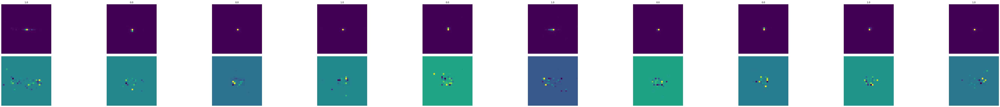

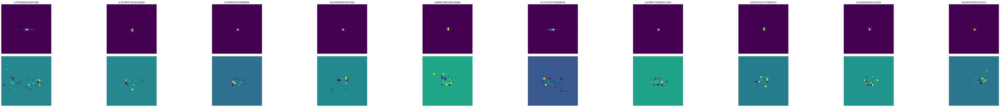

In [51]:
show_images((inputs.cpu()[0:10],targets.cpu()[0:10]))
show_images((inputs.cpu()[0:10],outputs.cpu()[0:10]))

# Evaluate

In [12]:
MODEL_PATH = './model.pt'
model.load_state_dict(torch.load(MODEL_PATH))

<All keys matched successfully>

In [0]:
test_loader = DataLoader(ParticleDataset(*test), 32)

In [76]:
acc = []
test_loader = DataLoader(ParticleDataset(*test), 32)
model = model.cuda()
for inputs, targets in test_loader:
  inputs = inputs.cuda()
  targets = targets.cuda()
  outputs = model(inputs).flatten()
  acc.append(get_acc(torch.round(outputs), targets).item())
print('acc-%f' % np.mean(acc))

acc-0.744708


In [0]:
# 16 epoch: 73.7%
# 32 epoch: 74.5

# Export ONNX Model

In [0]:
import torch.onnx

In [0]:
model.eval()

input_placeholder = torch.zeros((1, 2, 32, 32))
torch.onnx.export(model,
                  input_placeholder,
                  'e2e_particle_clf.onnx',
                  export_params=True,
                  opset_version=10,
                  do_constant_folding=True,
                  input_names=['input'],
                  output_names=['output'],
                  dynamic_axes={'input': {0 : 'batch_size'},
                               'output' : {0 : 'batch_size'}})

#Test ONNX Model

In [1]:
!pip install onnx
import onnx

In [0]:
onnx_model = onnx.load('e2e_particle_clf.onnx')
#onnx.checker.check_model(onnx_model)

In [0]:
x = torch.rand(10, 2, 32, 32)

In [25]:
!pip install onnxruntime
import onnxruntime

ort_session = onnxruntime.InferenceSession("e2e_particle_clf.onnx")

def to_numpy(tensor):
    return tensor.detach().cpu().numpy() if tensor.requires_grad else tensor.cpu().numpy()

# compute ONNX Runtime output prediction
ort_inputs = {ort_session.get_inputs()[0].name: to_numpy(x)}
ort_outs = ort_session.run(None, ort_inputs)

# compare ONNX Runtime and PyTorch results
model.eval()
np.testing.assert_allclose(to_numpy(model(x)), ort_outs[0], rtol=1e-03, atol=1e-05)

# TODO
- Make model deeper
- Train for longer
- Add drop out

# Notes
A 2x (parameter to dataset size) model with parameters fit the data as well as a 100x model

SGD and Adam use very different lr. SGD works will 0.03 , Adam lr is in the range of [0.01, 0.003, 0.0001]

Adam reaches SGD's convergence acc 20x faster, Adam+Batch Norm reaches Adam convergence acc 10x faster

Learning optimizations have so far correlated with performance and learning speed

Reducing the image dimension with the first layer decreases performance by 2%. The original information is quite low and the information content is heavily concentrated in a small area. So reducing dimensions too early is probably detrimental.

### Hyperparameters
ResNext paper used SGD with lr 0.1 (divided by 10 x3 over 90 epochs), minibatch 256, 0.00001 weight decay, 0.9 momentum